In [1]:
import tifffile
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import frgtools.plotting as frgplt
import frgtools.misc as frgm
import PIL
import tqdm
from copy import deepcopy
from frgtools import uvvis

In [2]:
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina')

# Load Data

In [12]:
inputdir = os.path.join('Worklist')
datadir = os.path.join('Data')

## Load experimental parameters from worklist

In [13]:
os.listdir(inputdir)

['Experiment Planning.ipynb',
 'SampleDataframe_MA(SnPbBiAg)I3 First Spread_absorbers.csv',
 'solutionmap_MA(SnPbBiAg)I3 First Spread_absorbers.jpeg',
 'pascalschedule_MA(SnPbBiAg)I3 First Spread_absorbers.png',
 'stocksolutions_MA(SnPbBiAg)I3 First Spread_absorbers.csv',
 'traymap_MA(SnPbBiAg)I3 First Spread_absorbers.jpeg',
 'OT2PASCALProtocol_MA(SnPbBiAg)I3 First Spread_absorbers.py',
 'maestronetlist_MA(SnPbBiAg)I3 First Spread_absorbers.json',
 'Experiment Planning-052cbeb4-ea45-4367-9297-4c968419bbc2.ipynb',
 '.ipynb_checkpoints',
 'Experiment Planning-b8eeb29c-c85a-4daa-8e2b-3f9f1b266fb4.ipynb',
 'weight_table.csv',
 'Experiment Planning-7fcb9849-1a52-4c0e-8a12-c4aaae285907.ipynb',
 'Experiment Planning-be52e93e-5157-49a4-bc3c-38520974a640.ipynb',
 'specbl.pkl']

In [15]:
worklistdf = pd.read_csv(
    os.path.join(
        inputdir,
        'SampleDataframe_MA(SnPbBiAg)I3 First Spread_absorbers.csv'),
    index_col=0
)

In [16]:
required_columns = ['name', 'storage_tray', 'storage_slot', 'spincoat0_drop0_solutes']
drop_columns = ['worklist']
unique_columns = [
    c
    for c in worklistdf.columns
    if (worklistdf[c].nunique() > 1
    or c in required_columns)
    and c not in drop_columns
    ] 
worklistdf = worklistdf[unique_columns]

In [17]:
worklistdf.head()

,name,storage_tray,storage_slot,spincoat0_drop0_solutes
0,sample0,Tray1,A1,MA_Sn0.6000_Pb0.4000_Bi0.0000_I3
1,sample1,Tray1,A2,MA_Sn0.6000_Pb0.4000_Bi0.0000_I3
2,sample2,Tray1,A3,MA_Sn0.6000_Pb0.4000_Bi0.0000_I3
3,sample3,Tray1,A4,MA_Sn0.6000_Pb0.4000_Bi0.0000_Ag0.0000_I3
4,sample4,Tray1,A5,MA_Sn0.6000_Pb0.4000_Bi0.0000_Ag0.0000_I3


In [18]:
worklistdf['Bi'] = worklistdf['spincoat0_drop0_solutes'].apply(lambda x: float(x.split('Bi')[1].split('_')[0]))

def get_ag(x):
    if 'Ag' in x:
        return float(x.split('Ag')[1].split('_')[0])
    else:
        return 0

worklistdf['Ag'] = worklistdf['spincoat0_drop0_solutes'].apply(get_ag)

## Load Process Data

In [19]:
with open(os.path.join(datadir, 'maestro_sample_log.json'), 'r') as f:
    log = json.load(f)

In [20]:
def readworklist(log):
    all_steps = {}
    taskidx = {t:0 for t in ['spincoat', 'anneal', 'characterize']}
    tasklist = list(log['tasks'].values())
    tasklist.sort(key=lambda x:x['start'])
    
    for before, this, after in zip(tasklist, tasklist[1:], tasklist[2:]):
        if this['task'] not in taskidx:
            continue
        key = f"{this['task']}{taskidx[this['task']]}"
        taskidx[this['task']] += 1
        this_step = {
            'target_start': this['start'],
            'start': this['start_actual'],
            'finish': this['finish_actual'],
            'duration': this['finish_actual']-this['start_actual']
        }
        
        if this['task'] == 'spincoat':
            if len(this['details']['drops']) == 1:
                this_step[f"drop0_offset"] =  this['liquidhandler_timings'][f"dispense_solution"] - (drop['time']+this['headstart'])
            else:
                for i, drop in enumerate(this['details']['drops']):
                    this_step[f"drop{i}_offset"] = this['liquidhandler_timings'][f"dispense_solution{i}"] - (drop['time']+this['headstart'])
        if this['task'] == 'anneal':
            this_step['duration'] = after['start_actual'] - before['finish_actual'] + 5
        
        for k,v in this_step.items():
            all_steps[f"{key}_{k}"] = v
    return all_steps

In [21]:
processdata = {sample:readworklist(info) for sample, info in log.items()}

In [22]:
processdf = pd.DataFrame(processdata).T
processdf['name'] = processdf.index
processdf.head()

,spincoat0_target_start,spincoat0_start,spincoat0_finish,spincoat0_duration,spincoat0_drop0_offset,spincoat0_drop1_offset,anneal0_target_start,anneal0_start,anneal0_finish,anneal0_duration,characterize0_target_start,characterize0_start,characterize0_finish,characterize0_duration,name
sample0,2037.0,2037.001054,2113.849290,76.848236,0.519698,0.622762,2161.0,2162.338553,3962.339300,1805.210267,5326.0,5325.995088,5541.282438,215.287350,sample0
sample1,6678.0,6678.015403,6754.682863,76.667459,0.506089,0.629640,6802.0,6803.423886,8603.435023,1799.228484,11605.0,11605.013561,11820.035866,215.022304,sample1
sample10,5987.0,5987.008866,6063.734740,76.725875,0.499368,0.629739,6111.0,6110.999184,7911.011195,1809.268645,10786.0,10785.994123,11001.329653,215.335529,sample10
sample11,3045.0,3045.020603,3121.746290,76.725688,0.497946,0.633969,3169.0,3171.459308,4971.479039,1805.064954,6691.0,6690.998413,6906.052809,215.054396,sample11
sample12,4012.0,4012.004407,4088.783190,76.778783,0.500898,0.623590,4136.0,4135.974841,5936.005318,1803.198211,8056.0,8056.009376,8271.059843,215.050467,sample12


## Load characterization data

In [23]:
def find_fid(s, fids):
    for fid in fids:
        if s in fid:
            return fid
    raise Exception(f"No file found for {s}")


In [24]:
def load_image(fid):
    img = tifffile.imread(fid)
    return img*64

def load_pl_spectrum(fid, idx=1):
    with open(fid, 'r') as f:
        dwelltimes = [float(dwell) for dwell in f.readline().split(',')[1:]]

    d = np.loadtxt(fid, delimiter=',', skiprows=2)

    wl = d[:,0]
    for i in range(d.shape[1]-1, 0, -1):
        if not any(np.isnan(d[:,i])):
            break
    cts = d[:,i]/dwelltimes[i-1]
    return wl, cts


def load_transmission_spectrum(fid, idx=1):
    d = np.loadtxt(fid, delimiter=',', skiprows=2)
    wl = d[:,0]
    t = d[:,1]
    return wl, t

In [25]:
from frgtools.curveprocessing import gaussian
from scipy.optimize import curve_fit

def fit_gaussian(x_nm,y, fit_range = (650, 1100), ev_guess = None, plot=False, adjust_baseline = False):
    x_ev = 1240/x_nm
    if adjust_baseline:
        bl = np.mean(y[x_ev<500])
        y = y-bl

    fit_mask = (x_nm>fit_range[0]) & (x_nm<fit_range[1])
    x_fit = x_ev[fit_mask]
    y_fit = y[fit_mask]
    if ev_guess is None:
        ev_guess = x_fit[np.argmax(y_fit)]

    ev_guess_min = max(ev_guess-0.2, x_ev.min())
    ev_guess_max = min(ev_guess+0.2, x_ev.max())
    bounds = [
        [0,ev_guess_min,0.02],
        [y_fit.max()*1.2, ev_guess_max, 0.05]
    ]
    
    p0 = [y_fit.max(), ev_guess, 0.025]

#     y0 = np.mean(y[y-y.min() < y.std()])
    try:
        popt, _ = curve_fit(gaussian, x_fit, y_fit, p0=p0, bounds=bounds)
        out = {
            'intensity': popt[0],
            'peakev': popt[1],
            'fwhm': 2.355*popt[2], #sigma -> fwhm
            'wl': x_nm,
            'cps': gaussian(x_ev,*popt)
        }
        if plot:
            plt.figure()
            plt.scatter(x_ev,y, color='k', s=2)
            plt.plot(x_ev, gaussian(x_ev, *popt), color='r')
    except:
        out = {
            'intensity': np.nan,
            'peakev': np.nan,
            'fwhm': np.nan,
            'wl': x_nm,
            'cps': y
        }
        print('error fitting PL')
    return out

In [26]:
dffids = frgm.listdir(os.path.join(datadir,'Darkfield'))
bffids = frgm.listdir(os.path.join(datadir,'Brightfield'))
plfids = frgm.listdir(os.path.join(datadir,'PLImaging'))
photostabilityfids = frgm.listdir(os.path.join(datadir,'PLPhotostability_405'))
redplsfids = frgm.listdir(os.path.join(datadir,'PL_635'))
transmissionfids = frgm.listdir(os.path.join(datadir,'Transmission'))

In [27]:
def fit_gaussian_series(wl, cts, fit_range = (650, 1100), plot=False, adjust_baseline = False):
    out = []
    ev_guess = None
    for i, cts_ in enumerate(cts):
        out.append(fit_gaussian(wl, cts_, fit_range = fit_range, ev_guess = ev_guess, plot=plot, adjust_baseline = adjust_baseline))
        ev_guess = out[-1]['peakev']
    outseries = {k:[] for k in out[0].keys()}
    for o in out:
        for k in o.keys():
            outseries[k].append(o[k])
    return outseries

In [28]:
def exponential(x, a, b, c):
    return -a*np.exp(-b*x)+c
def fit_exponential(x,y):
    bounds = [[-np.inf,0,0], [np.inf, 1, np.inf]]
    p0 = [y[0]-y[-1], 0.02, y[-1]]
    popt, _ = curve_fit(exponential, x, y, p0=p0, bounds=bounds)
    return popt

In [29]:
def load_photostability(fid, plot=False):
    try:
        with open(fid, 'r') as f:
            dwelltime = float(f.readline().split(',')[1]) #dwelltime, in milliseconds
            for i in range(2): 
                f.readline() #skip rest of header
            times = [float(t) for t in f.readline().split(',')[1:]]

        d = np.loadtxt(fid, delimiter=',', skiprows=4)
        wl = d[:,0]
        cts = d[:,1:].T/dwelltime
        blcts = np.mean(cts[:,wl<500], axis=1)
        cts -= blcts[:,np.newaxis]

        series = fit_gaussian_series(wl, cts, adjust_baseline = False)
        
        if np.nanmax(series['intensity']) < 0.15:
            raise Exception('No visible pl data')
        scale, rate, saturation = fit_exponential(times, series['intensity'])
        evscale, evrate, evsaturation = fit_exponential(times, series['peakev'])
        if plot:
            fig, ax = plt.subplots(1,3, figsize = (12,4))
            for i, (c, cfit) in enumerate(zip(cts, series['cps'])):
                ax[0].scatter(wl, c, color=plt.cm.viridis(i/len(cts)), s=2)
                ax[0].plot(wl, cfit, color=plt.cm.viridis(i/len(series['cps'])))
                ax[0].set_xlim(650,1100)
            ax[1].scatter(times, series['intensity'])
            ax[1].plot(times, exponential(np.asarray(times), scale,rate,saturation))
            ax[2].scatter(times, series['peakev'])
            ax[2].plot(times, exponential(np.asarray(times), evscale,evrate,evsaturation))
        
            ax[0].set_xlabel('Wavelength (nm)')
            for ax_ in ax[:2]:
                ax_.set_ylabel('Counts/second')
            for ax_ in ax[1:]:
                ax_.set_xlabel('Time (s)')
            ax[2].set_ylabel('Emission Center (eV)')

            plt.tight_layout()
            plt.show()
            
        return dict(
            intensity = dict(
                scale = scale/np.nanmax(series['intensity']),
                rate = rate,
                saturation = saturation
            ),
            peakev = dict(
                scale = evscale,
                rate = evrate,
                saturation = evsaturation
            )
        )
    except:
        print('error loading photostability')
        return dict(
            intensity = dict(
                scale = np.nan,
                rate = np.nan,
                saturation = np.nan
            ),
            peakev = dict(
                scale = np.nan,
                rate = np.nan,
                saturation = np.nan
            )
        )

error loading photostability
error loading photostability
error loading photostability


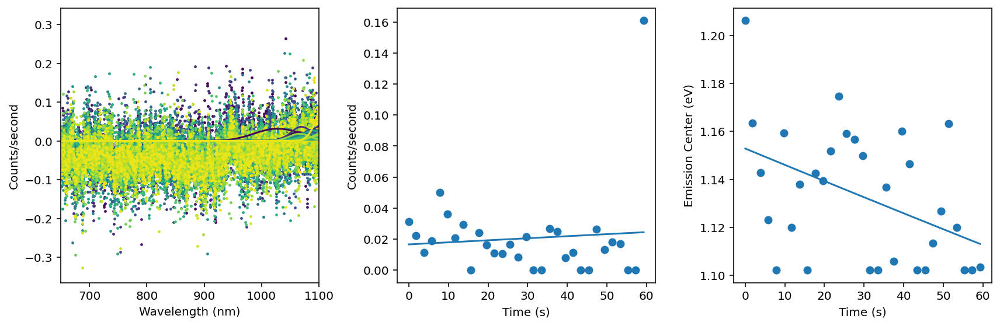

error loading photostability
error loading photostability
error loading photostability
error loading photostability
error loading photostability
error loading photostability


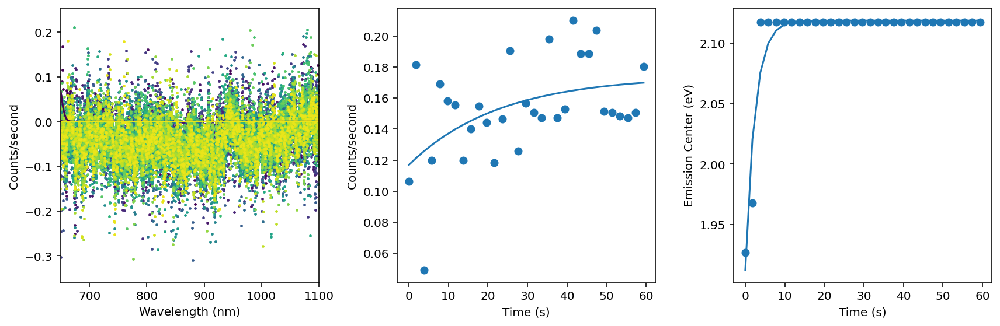

error loading photostability


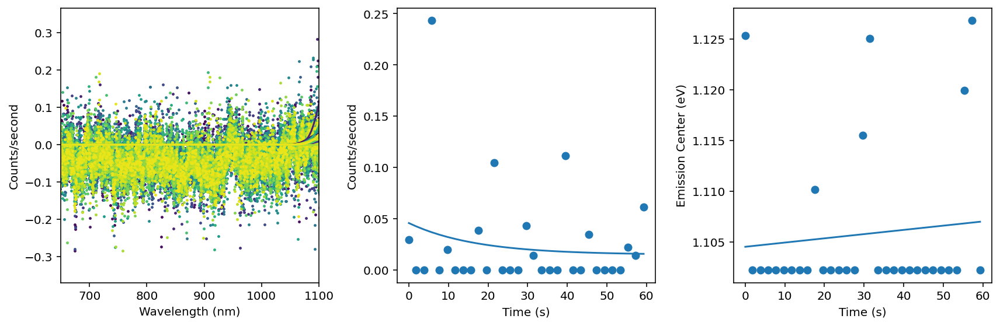

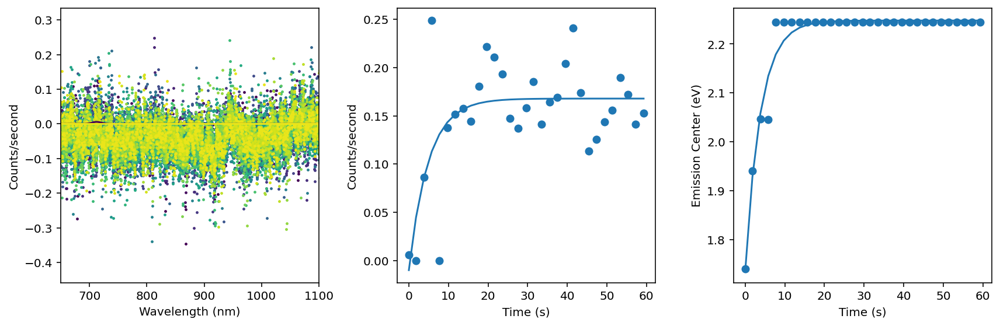

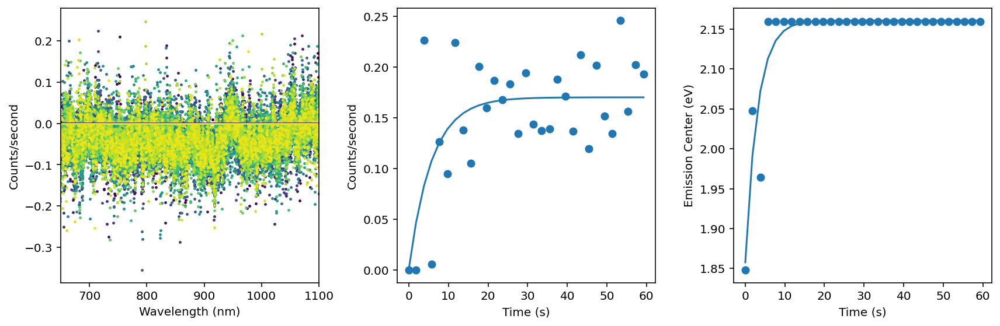

error loading photostability
error loading photostability
error loading photostability
error loading photostability


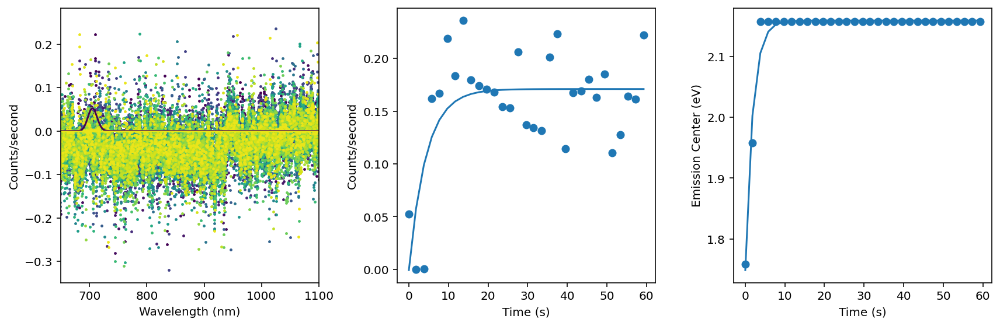

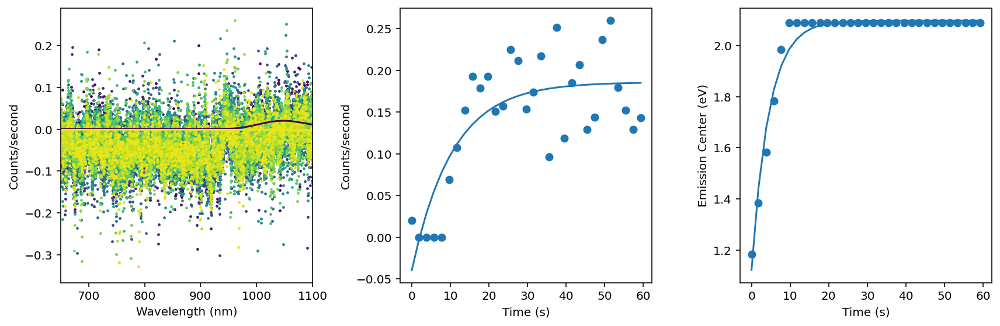

error loading photostability
error loading photostability
error loading photostability
error loading photostability
error loading photostability
error loading photostability
error loading photostability
error loading photostability
error loading photostability


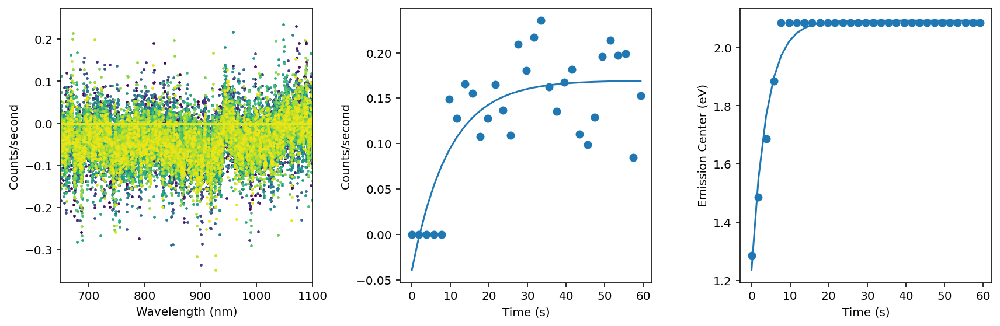

error loading photostability


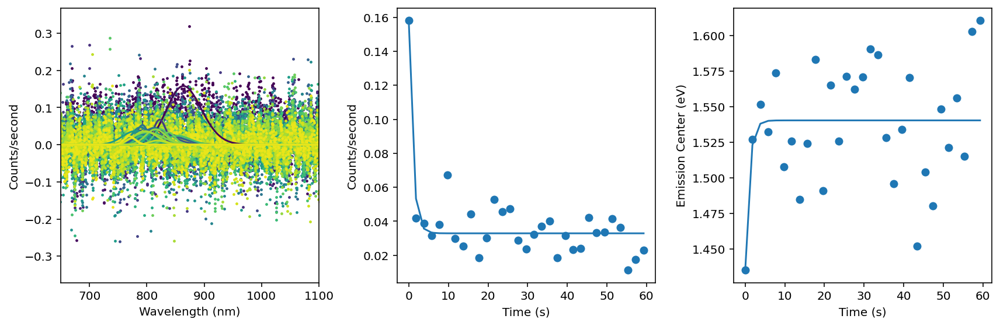

error loading photostability


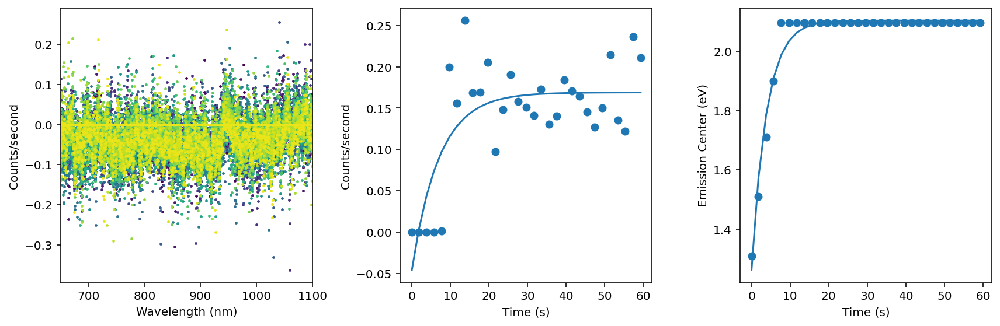

error loading photostability


In [58]:
for fid in photostabilityfids:
    load_photostability(fid, plot=True)

In [30]:
fit_range = (800,1200)

#####

cols = ['storage_tray', 'storage_slot', 'darkfield', 'brightfield', 'plimage', 'redplspec','redplspec_intensity','redplspec_peakev','redplspec_fwhm', 'redplspec_fit', 'transmission', 'photostability_intensity_rate', 'photostability_intensity_scale', 'photostability_peakev_rate', 'photostability_peakev_scale']
dfData = {c:[] for c in cols}
wavelengths = load_pl_spectrum(redplsfids[0])[0]
fit_mask = slice(
    np.argmin(np.abs(wavelengths-fit_range[0])),
    np.argmin(np.abs(wavelengths-fit_range[1])),
)
              
for _,r in tqdm.tqdm_notebook(worklistdf.iterrows(), total=len(worklistdf)):
    # s = f"{r['storage_tray']}-{r['storage_slot']}"
    s = r['name']
    try:
        dfData['darkfield'].append(load_image(find_fid(s, dffids))[:,:,0])
    except:
        print(f'Data missing for {s}')
        continue
    # dfData['name'].append(s)
    dfData['storage_tray'].append(r['storage_tray'])
    dfData['storage_slot'].append(r['storage_slot'])
    dfData['brightfield'].append(load_image(find_fid(s, bffids)))
    dfData['plimage'].append(load_image(find_fid(s, plfids))[:,:,0])

    #spectral data
    spec = load_pl_spectrum(find_fid(s, redplsfids), -1)[1]
    specfit = fit_gaussian(wavelengths[fit_mask], spec[fit_mask])
    dfData['redplspec'].append(spec)
    dfData['redplspec_peakev'].append(specfit['peakev'])
    dfData['redplspec_intensity'].append(specfit['intensity'])
    dfData['redplspec_fwhm'].append(specfit['fwhm'])
    dfData['redplspec_fit'].append(specfit['cps'])

    dfData['transmission'].append(load_transmission_spectrum(find_fid(s, transmissionfids))[1])

    #photostability data
    
    ps = load_photostability(find_fid(s, photostabilityfids))
    dfData['photostability_intensity_rate'].append(ps['intensity']['rate'])
    dfData['photostability_intensity_scale'].append(ps['intensity']['scale'])
    dfData['photostability_peakev_rate'].append(ps['peakev']['rate'])
    dfData['photostability_peakev_scale'].append(ps['peakev']['scale'])


<ipython-input-30-3c4cbed9e3d8>:13: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for _,r in tqdm.tqdm_notebook(worklistdf.iterrows(), total=len(worklistdf)):


  0%|          | 0/36 [00:00<?, ?it/s]

error fitting PL
error loading photostability
error fitting PL
error fitting PL
error loading photostability
error fitting PL
error loading photostability
error fitting PL
error loading photostability
error fitting PL
error loading photostability
error fitting PL
error fitting PL
error fitting PL
error loading photostability
error fitting PL
error loading photostability
error fitting PL
error loading photostability
error fitting PL
error loading photostability
error fitting PL
error loading photostability
error fitting PL
error loading photostability
error fitting PL
error loading photostability
error fitting PL
error loading photostability
error fitting PL
error loading photostability
error fitting PL
error loading photostability
error fitting PL
error loading photostability
error fitting PL
error loading photostability
error fitting PL
error loading photostability
error fitting PL
error loading photostability
error fitting PL
error loading photostability
error fitting PL
error fittin

In [31]:
datadf = pd.DataFrame(dfData)

In [32]:
datadf['absorbance'] = datadf['transmission'].apply(lambda x: -np.log(x))

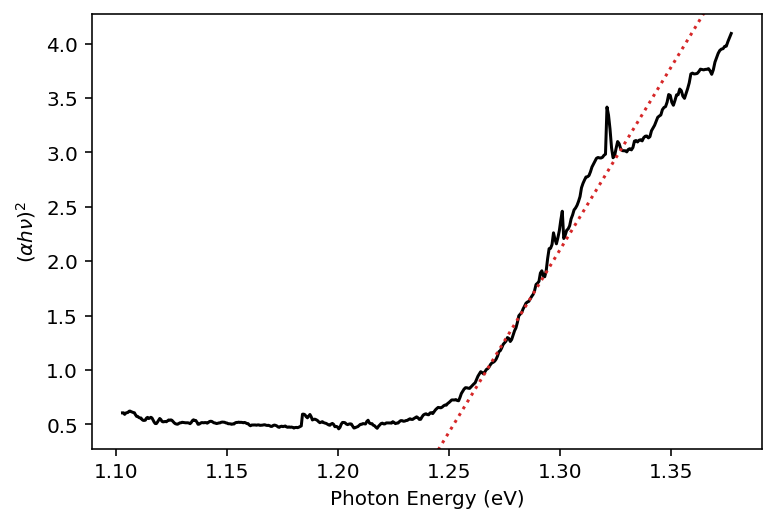

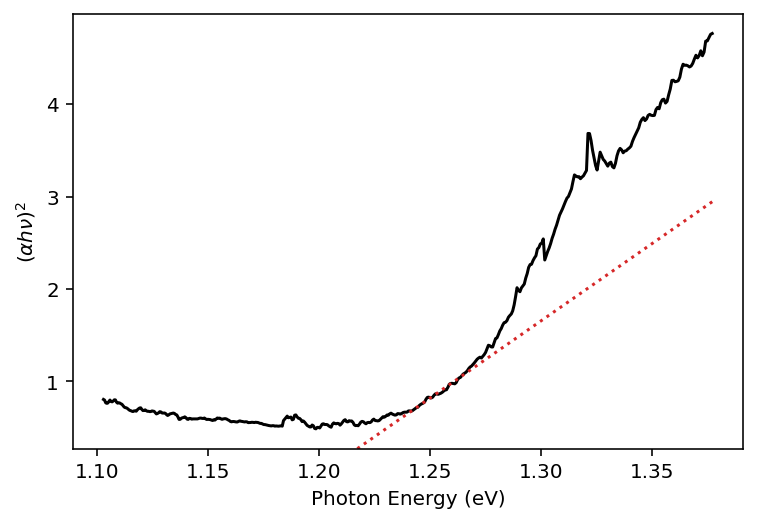

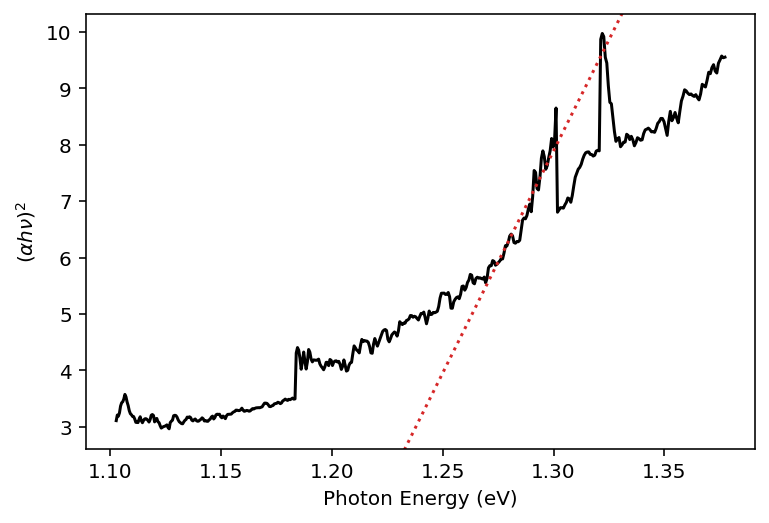

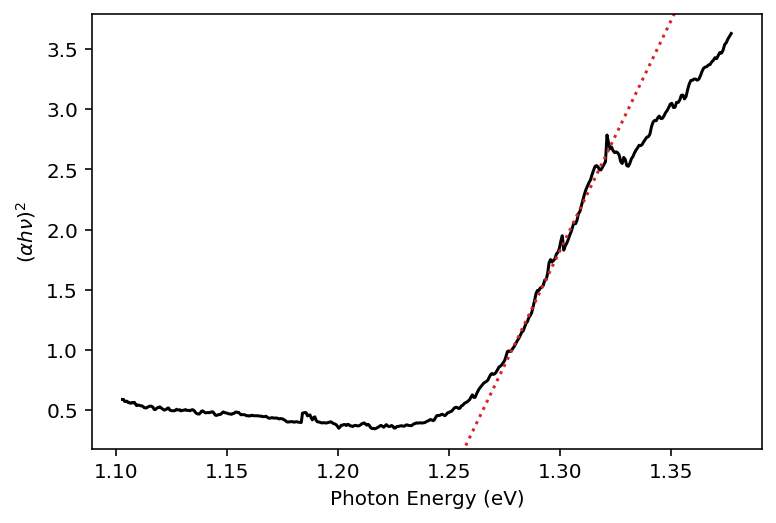

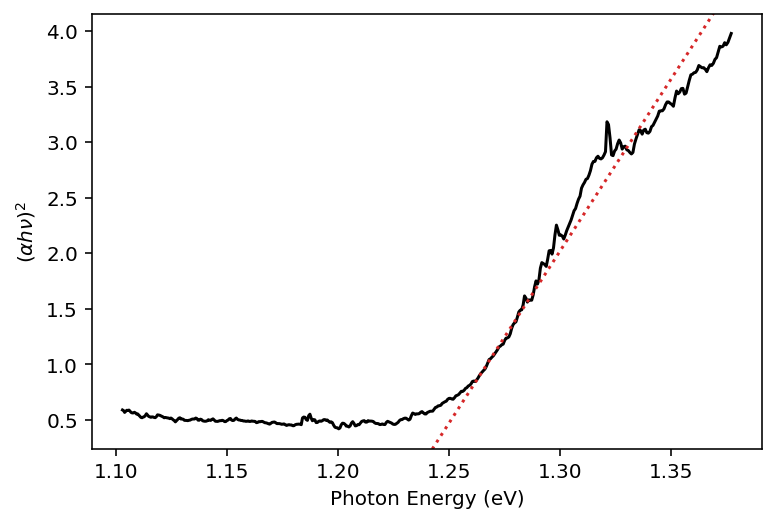

...

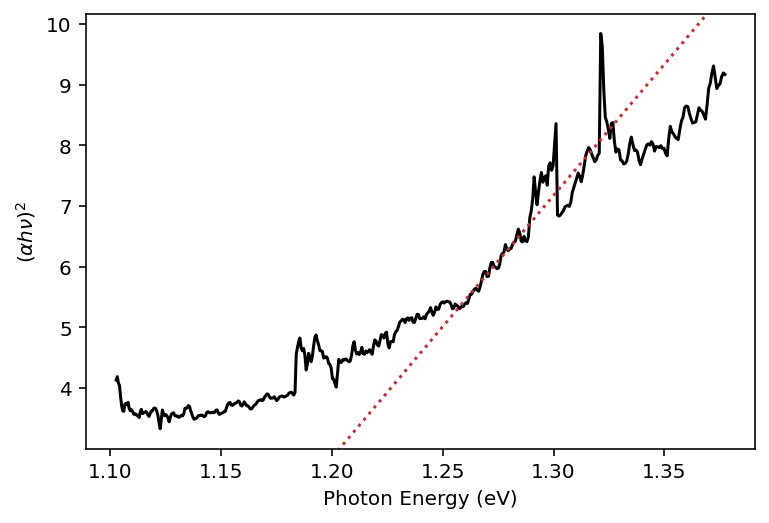

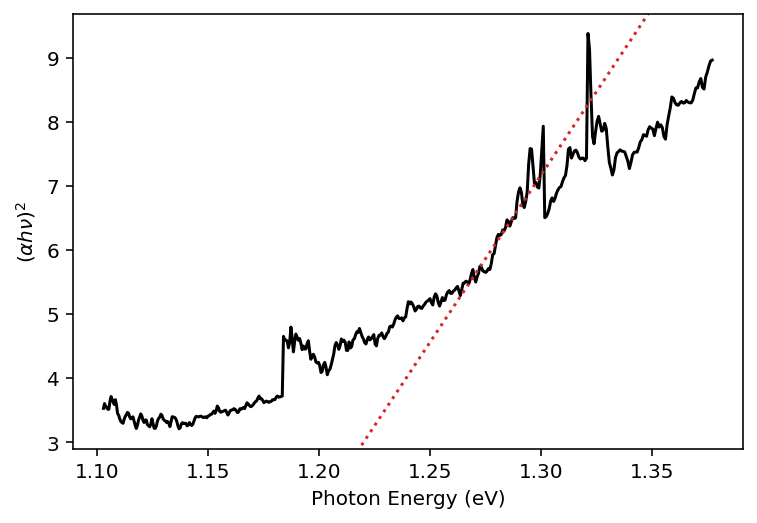

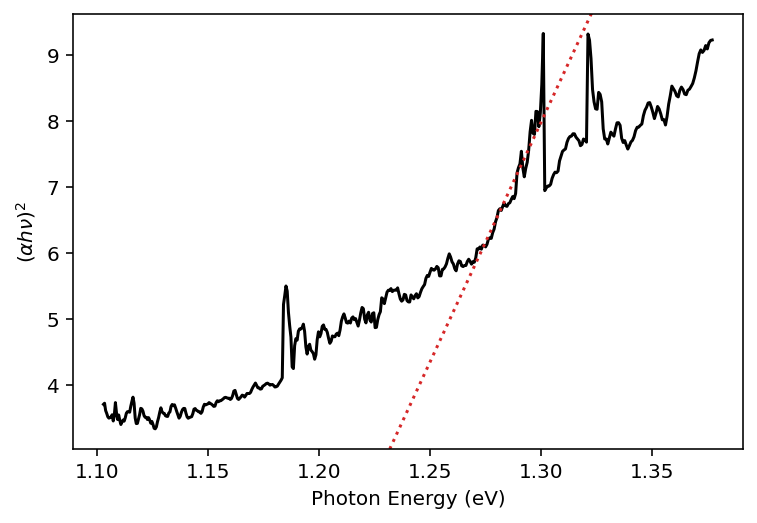

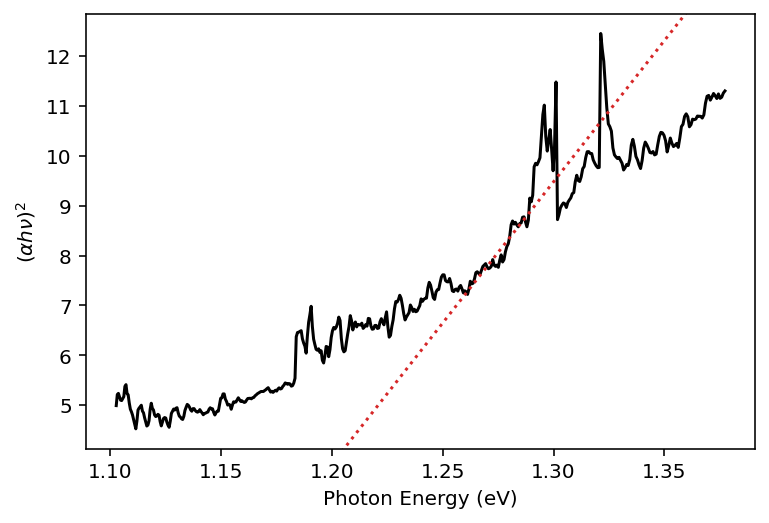

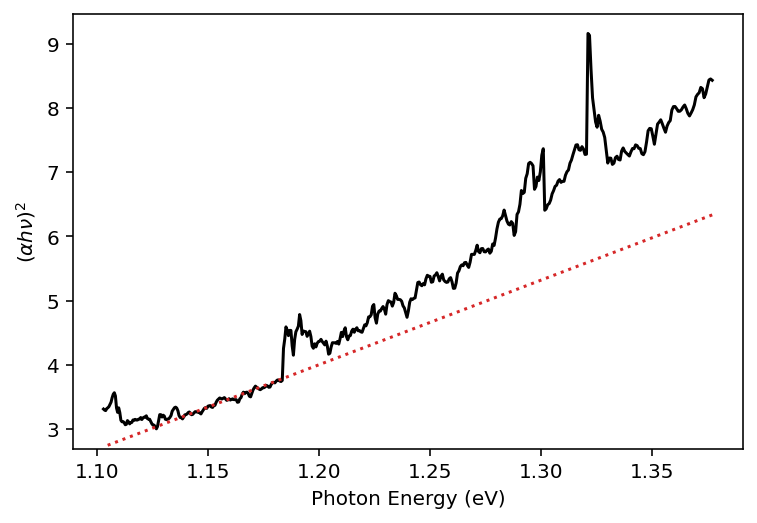

In [33]:
datadf['bandgap'] = datadf['absorbance'].apply(
    lambda a:
    uvvis.tauc(
        wavelengths,
        a,
        bandgap_type='direct',
        wlmin=900,
        wlmax=wavelengths[2046],
        plot=True,
        fit_width=50
    )
)

In [34]:
datadf['emission_energy'] = datadf['redplspec_peakev']

In [35]:
df = worklistdf.merge(datadf, on=['storage_tray', 'storage_slot'])
df = df.merge(processdf, on=['name'])

In [36]:
def images_overview(df, bf_kws={}, df_kws={}, pl_kws={}):
    for _, r in df.iterrows():
        fig, ax = plt.subplots(1,3,figsize=(6,2))
        ax[0].imshow(r['brightfield'], **bf_kws)
        ax[1].imshow(r['darkfield'], **df_kws)
        ax[2].imshow(r['plimage'], **pl_kws)
        frgplt.scalebar(2e-3/1440, ax=ax[1])
        frgplt.scalebar(2e-3/1440, ax=ax[2])
        
        for ax_ in ax:
            ax_.set_xticks([])
            ax_.set_yticks([])
            
        ax[0].set_ylabel(r['name'])
        plt.show()

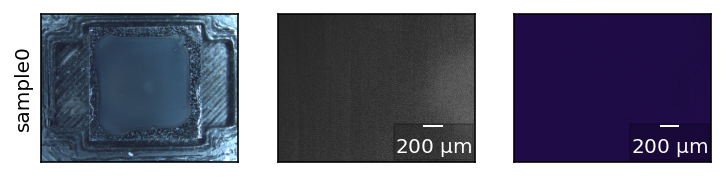

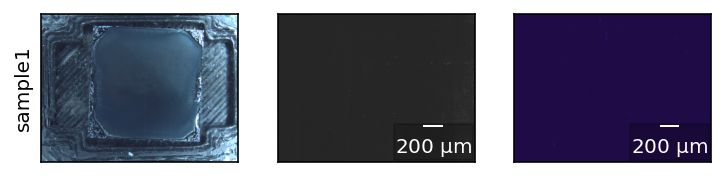

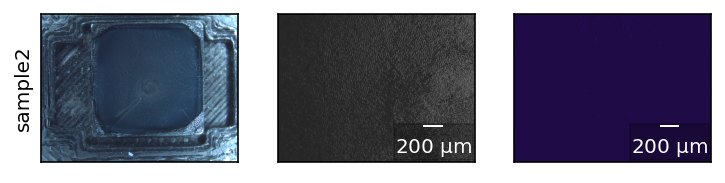

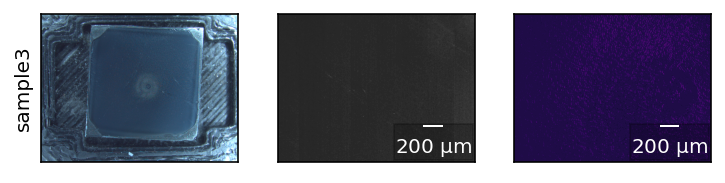

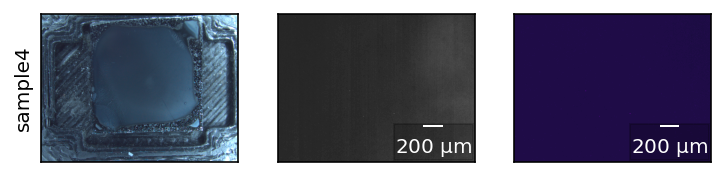

...

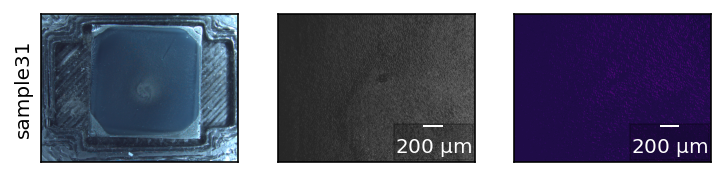

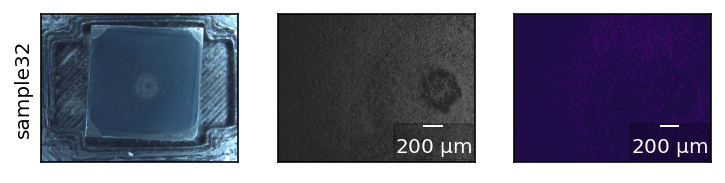

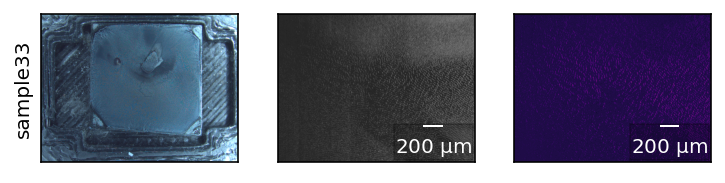

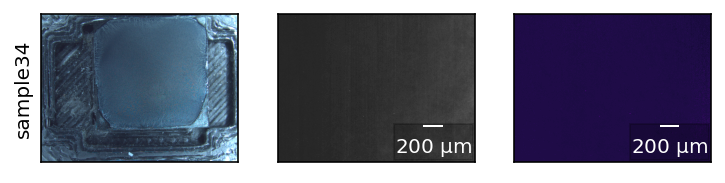

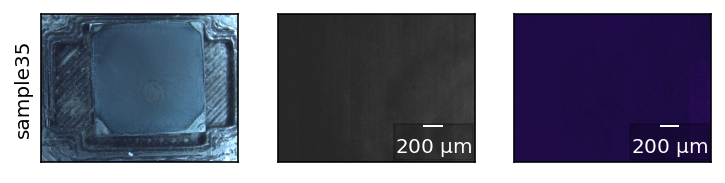

In [37]:
images_overview(
    df,
    df_kws = dict(
        vmin=0,
        vmax=0.25,
        cmap=plt.cm.gray
    ),
    pl_kws = dict(
        vmin = 0,
        vmax=0.3,
        cmap=plt.cm.inferno
    )
)

Pruning bad data

In [38]:
bad_photostability = []


idx = df[df['name'].isin(bad_photostability)].index
df.loc[
    idx, 
    [
    'photostability_intensity_rate',
    'photostability_intensity_scale',
    'photostability_peakev_rate', 
    'photostability_peakev_scale',
    ]
] = np.nan

In [39]:
missing_characterization = ['sample24']

df['missing_characterization'] = df['name'].isin(missing_characterization)

In [40]:
df.to_csv('processed_data_snpbbiag1.csv')

In [41]:
df_ = df[~df['missing_characterization']]

# Plotting Results

In [42]:
def plot_image_array(df, rows, cols, show, duplicates,figsize=None,**plot_kws):
    rowvals = df[rows].unique()
    rowvals.sort()
    colvals = df[cols].unique()
    colvals.sort()

    if figsize is None:
        figsize = (
                len(rowvals)*4,
                len(colvals)*4)

    fig = plt.figure(
        figsize=figsize,
        constrained_layout=False,
    )
    outer_grid = fig.add_gridspec(len(rowvals), len(colvals), wspace=0.1, hspace=0.1)

    def plot_from_df(r, ax):
        im = r[show]
        ax.imshow(im, **plot_kws)
        ax.set(xticks=[], yticks=[])

    for a, rv in enumerate(rowvals):
        for b, cv in enumerate(colvals):
            # gridspec inside gridspec
            dfsel = df[
                (df[rows]==rv)
                & (df[cols]==cv)
            ]
            if len(dfsel) == 0:
                continue
            n_cols = min([duplicates, 3])
            n_rows = np.ceil(dfsel.shape[0]/n_cols).astype(int)        
            if figsize[1]<figsize[0]:
                n_rows, n_cols = n_cols, n_rows

            inner_grid = outer_grid[a,b].subgridspec(n_rows, n_cols, wspace=0, hspace=0)
            axs = inner_grid.subplots()  # Create all subplots for the inner grid.
            axs_ = iter(axs.ravel())
            for _, r in dfsel.iterrows():
                ax = axs_.__next__()
                plot_from_df(r, ax)
            for ax in axs_:
                ax.axis('off')
            for ax in axs_:
                ax.set(xticks=[], yticks=[])
            if a == 0:
                axs.ravel()[0].set_title(cv)
    #             ax.figure.suptitle(cv)
            if b == 0:
                axs.ravel()[0].set_ylabel(rv, rotation=0, ha='right')
    #             ax.figure.supylabel(rv)

In [43]:
ev = 1240/wavelengths


In [50]:
dfsel = df[df['Bi'] == 0]

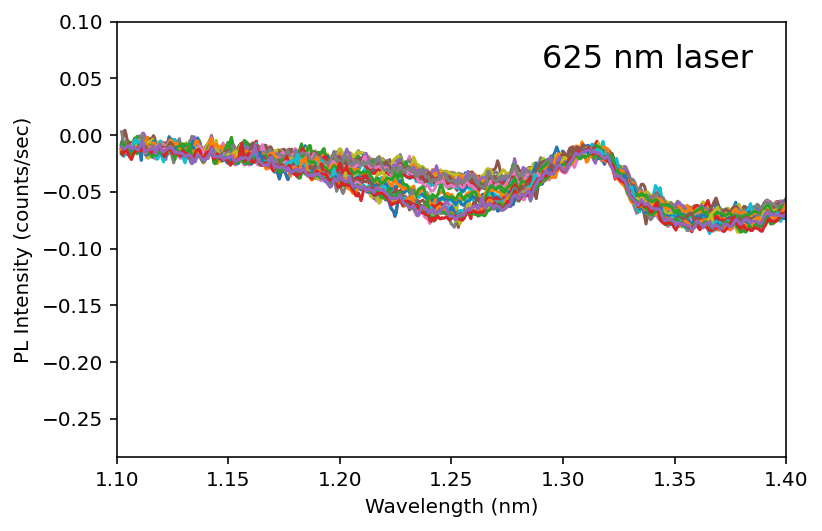

In [52]:
for _,r in df_.iterrows():
    plt.plot(1240/wavelengths, r['redplspec'])
plt.ylim(top=0.1)
plt.xlim(1.1, 1.4)
plt.xlabel('Wavelength (nm)')
plt.ylabel('PL Intensity (counts/sec)')
# plt.xlim(800,1200)
frgplt.cornertext('625 nm laser', fontsize=16)
plt.savefig('Red PL array', dpi=300)

In [52]:
df['has_Ag'] = df['Ag']>0

In [53]:
dfsel = df[['Bi', 'has_Ag', 'absorbance']]
dfsel['wavelengths'] = [wavelengths[:-1] for i in range(len(dfsel))]
dfsel = dfsel.explode(
    column=[
        'absorbance',
        'wavelengths']
    
)

<ipython-input-53-1b2aa0c13b6c>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfsel['wavelengths'] = [wavelengths[:-1] for i in range(len(dfsel))]


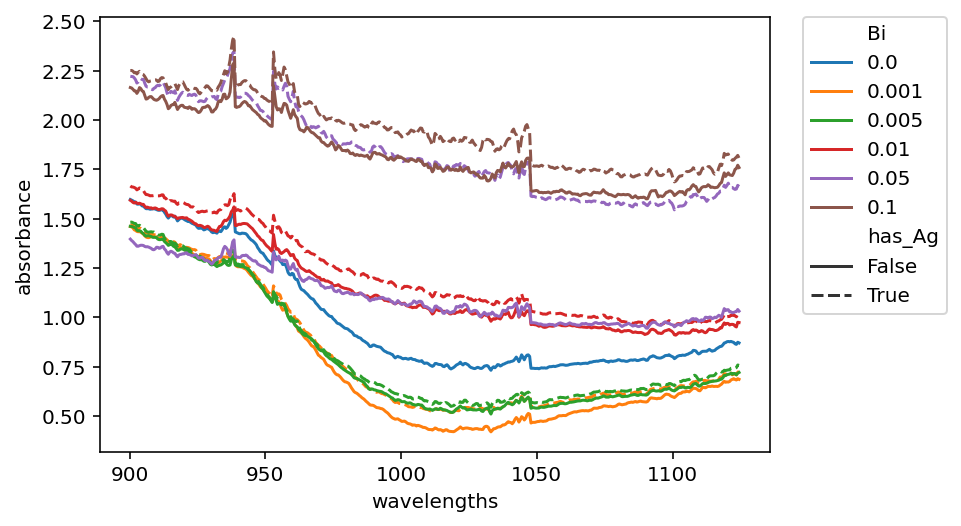

In [55]:
sns.lineplot(
    x='wavelengths',
    y='absorbance',
    hue='Bi',
    style='has_Ag',
    data=dfsel[
        (dfsel['wavelengths']>900)
    ],
    ci=None,
    palette ='tab10'
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [94]:
import pandas as pd

In [85]:
dfsel['absorbance'].values[0].shape

(2047,)

Text(0, 0.5, 'Absorbance (AU)')

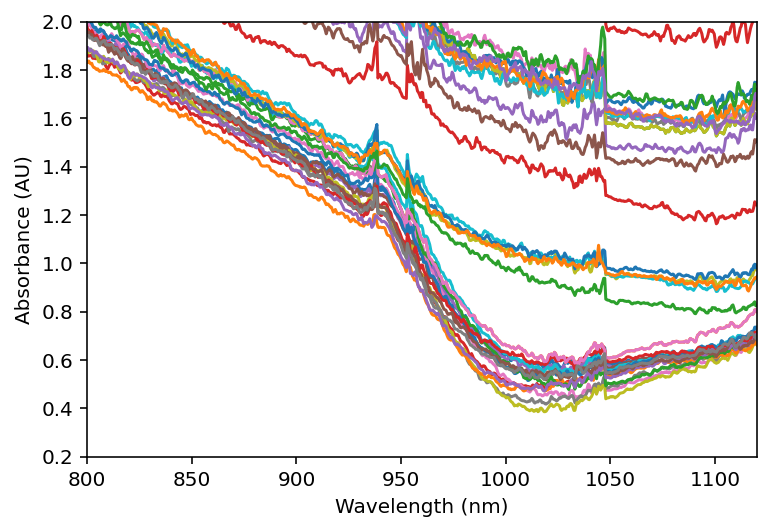

In [64]:
for _,r in df_.iterrows():
    plt.plot(wavelengths[:-1], r['absorbance'])
plt.xlim(800,1120)
plt.ylim(bottom=0.2,top=2)
plt.xlabel('Wavelength (nm)')
plt.ylabel('Absorbance (AU)')
# plt.xlim(600,850)
# frgplt.cornertext('405 nm laser', fontsize=16)
# plt.savefig('Blue PL array', dpi=300)

## Images

In [194]:
def images_overview(df, bf_kws={}, df_kws={}, pl_kws={}):
    for _, r in df.iterrows():
        fig, ax = plt.subplots(1,3,figsize=(6,2))
        ax[0].imshow(r['brightfield'], **bf_kws)
        ax[1].imshow(r['darkfield'], **df_kws)
        ax[2].imshow(r['plimage'], **pl_kws)
        frgplt.scalebar(2e-3/1440, ax=ax[1])
        frgplt.scalebar(2e-3/1440, ax=ax[2])
        
        for ax_ in ax:
            ax_.set_xticks([])
            ax_.set_yticks([])
            
        ax[0].set_ylabel(r['name'])
        plt.show()

In [55]:
df.columns

Index(['name', 'storage_tray', 'storage_slot', 'spincoat0_drop0_solutes',
       'darkfield', 'brightfield', 'plimage', 'redplspec',
       'redplspec_intensity', 'redplspec_peakev', 'redplspec_fwhm',
       'redplspec_fit', 'transmission', 'photostability_intensity_rate',
       'photostability_intensity_scale', 'photostability_peakev_rate',
       'photostability_peakev_scale', 'absorbance', 'bandgap',
       'emission_energy', 'spincoat0_target_start', 'spincoat0_start',
       'spincoat0_finish', 'spincoat0_duration', 'spincoat0_drop0_offset',
       'spincoat0_drop1_offset', 'anneal0_target_start', 'anneal0_start',
       'anneal0_finish', 'anneal0_duration', 'characterize0_target_start',
       'characterize0_start', 'characterize0_finish', 'characterize0_duration',
       'missing_characterization'],
      dtype='object')

No handles with labels found to put in legend.


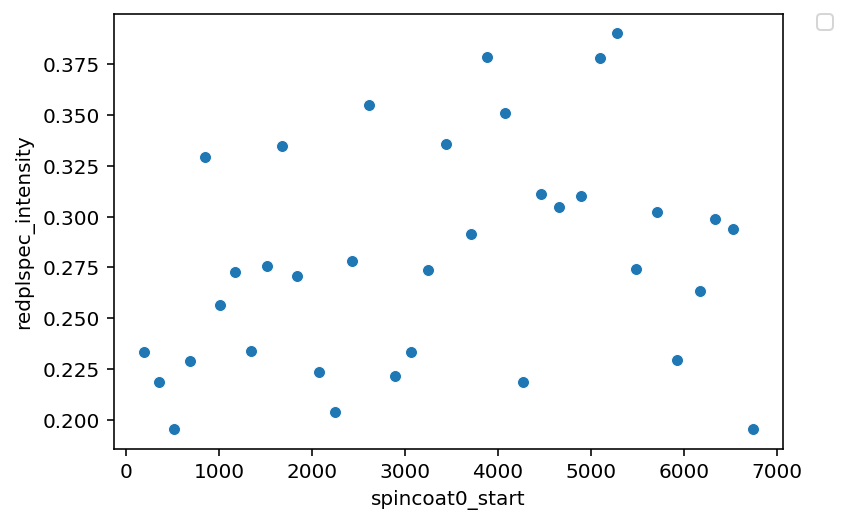

In [57]:
sns.scatterplot(
    data=df_,
    x='spincoat0_start',
    y='redplspec_intensity',
    # hue='spincoat0_drop0_solutes',
    # palette='Set1'
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

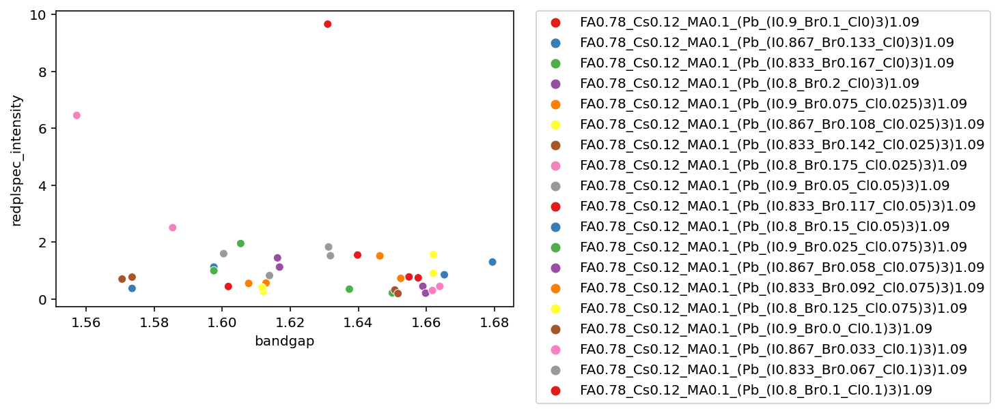

In [90]:
sns.scatterplot(
    data=df[~df['missing_characterization']],
    x='bandgap',
    y='redplspec_intensity',
    hue='spincoat0_drop0_solutes',
    palette='Set1'
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

<AxesSubplot:>

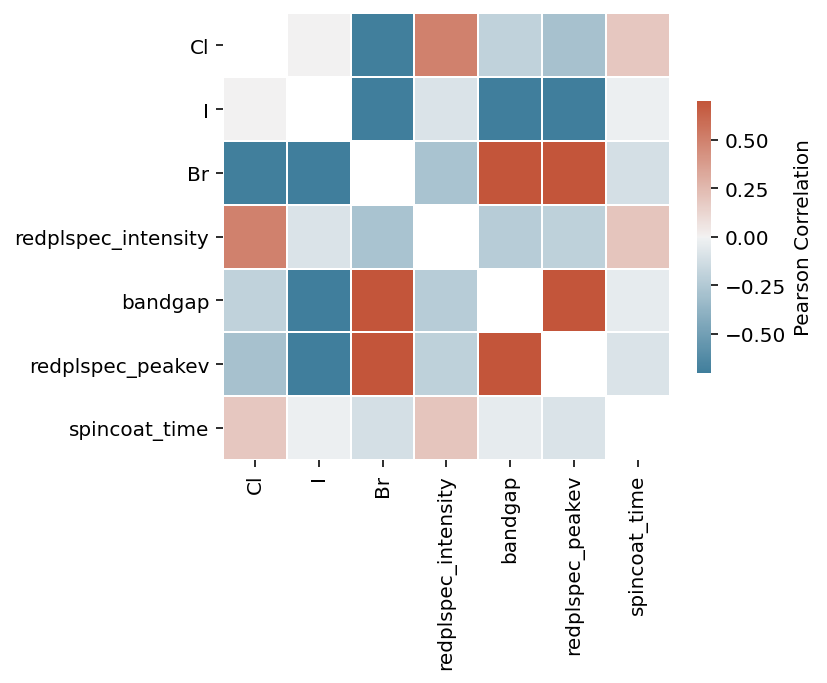

In [83]:
columns = [
    # 'order',
    'Cl',
    'I',
    'Br',
    'redplspec_intensity',
    'bandgap',
    'redplspec_peakev',
    'spincoat_time'
]

d = df[
    ~df['missing_characterization']
][columns]
# Compute the correlation matrix
corr = d.corr(
    method='pearson'
)

# Generate a mask for the upper triangle
# mask = np.triu(np.ones_like(corr, dtype=bool))
mask = np.eye(corr.shape[0])

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(5, 5))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(
    corr,
    mask=mask,
    cmap=cmap,
    vmax=.7,
    vmin=-0.7,
    center=0,
    square=True,
    linewidths=.5,
    cbar_kws={
        "shrink": .5,
        "label": 'Pearson Correlation'
    }
)

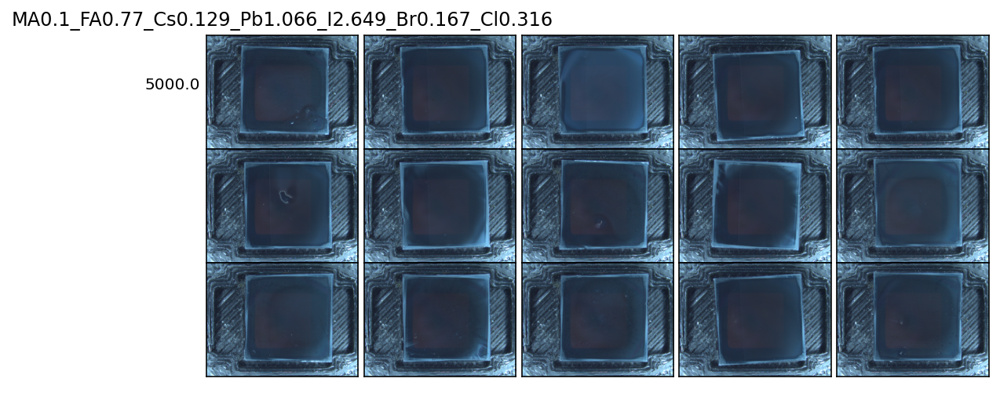

In [ ]:
plot_image_array(
    df = df,
    rows = 'rpm',
    cols = 'solutes',
    show = 'brightfield',
    duplicates = 5,
    vmax=0.1,
    figsize=(9,4)
)
##############


plt.savefig('Brightfield', dpi=300, bbox_inches='tight')

C:\ProgramData\Anaconda3\lib\site-packages\matplotlib_scalebar\scalebar.py:405: MatplotlibDeprecationWarning: 
The 'minimumdescent' parameter of __init__() was deprecated in Matplotlib 3.4 and will be removed two minor releases later. If any parameter follows 'minimumdescent', they should be passed as keyword, not positionally.
  txtscale = TextArea(scale_label, minimumdescent=False, textprops=textprops)


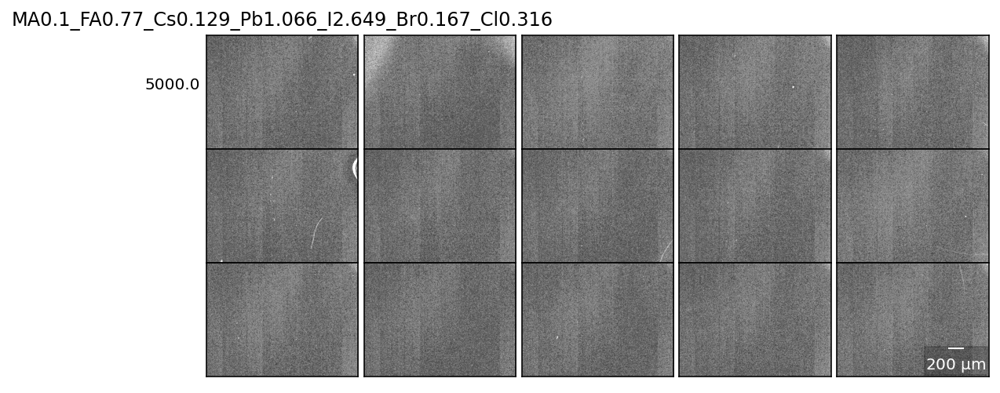

In [ ]:
plot_image_array(
    df = df,
    rows = 'rpm',
    cols = 'solutes',
    show = 'darkfield',
    duplicates = 5,
    vmax=0.1,
    figsize=(9,4),
    cmap=plt.cm.gray
)
frgplt.scalebar(2e-3/1440)
##############

plt.savefig('Darkfield', dpi=300, bbox_inches='tight')

C:\ProgramData\Anaconda3\lib\site-packages\matplotlib_scalebar\scalebar.py:405: MatplotlibDeprecationWarning: 
The 'minimumdescent' parameter of __init__() was deprecated in Matplotlib 3.4 and will be removed two minor releases later. If any parameter follows 'minimumdescent', they should be passed as keyword, not positionally.
  txtscale = TextArea(scale_label, minimumdescent=False, textprops=textprops)


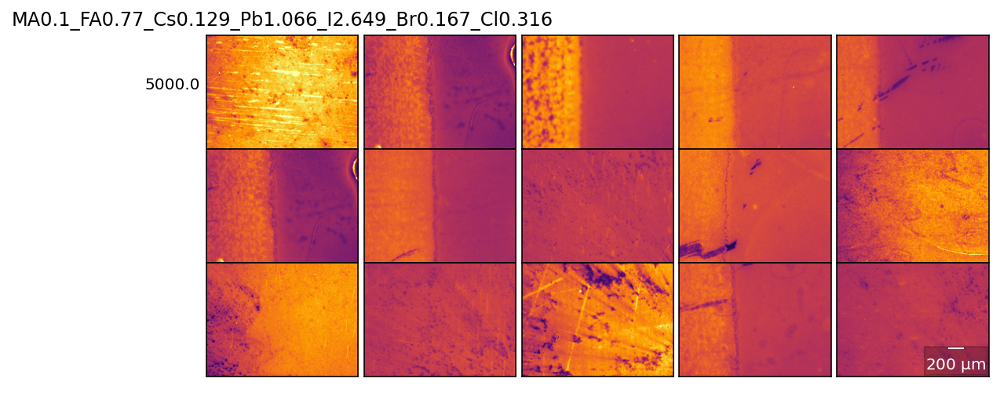

In [ ]:
plot_image_array(
    df = df,
    rows = 'rpm',
    cols = 'solutes',
    show = 'plimage',
    duplicates = 3,
    figsize=(9,4),
    vmax=0.5,
    cmap=plt.cm.inferno
)
frgplt.scalebar(2e-3/1440)
##############


# plt.savefig('Brightfield', dpi=300, bbox_inches='tight')

In [ ]:
string_cols = ['name', 'storage_tray', 'storage_slot', 'solutes', 'solvent', 'antisolvent', 'spincoat_recipe']
for sc in string_cols:
    df[sc] = df[sc].astype(str)

In [ ]:
featurecols = [c for c in df.columns if type(df[c].values[0]) != np.ndarray]
speccols = ['blueplspec', 'redplspec', 'transmission']

dfd = {c:[] for c in featurecols + ['wavelength'] + speccols}
for _,r in df.iterrows():
    for i, wl in enumerate(wavelengths[:-1]):
        for sc in speccols:
            dfd[sc].append(r[sc][i])
        dfd['wavelength'].append(wl)
        for c in featurecols:
            dfd[c].append(r[c])
specdf = pd.DataFrame(dfd)

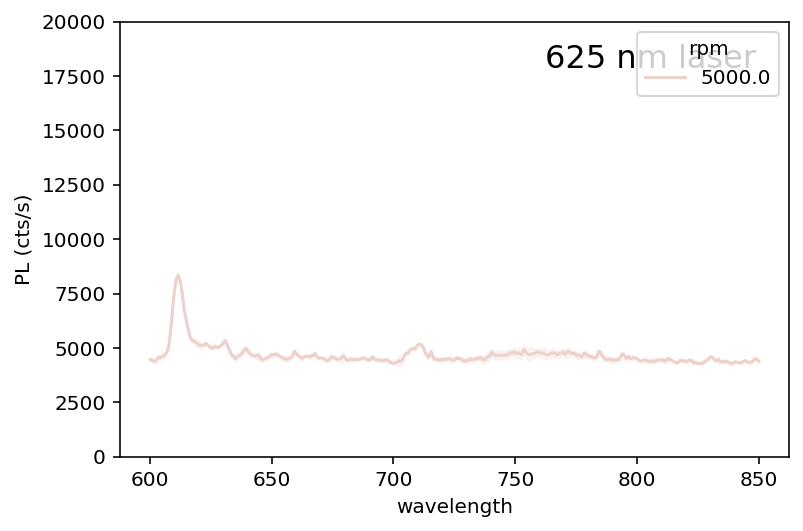

In [ ]:
sns.lineplot(
    data = specdf[
        (specdf['wavelength']>600)
        & (specdf['wavelength'] < 850)
    ],
    x='wavelength',
    y='redplspec',
    hue='rpm',
#     palette='tab10',
#     style='antisolvent_droptime',
    ci = 'sd',
#     n_boot=10
)
plt.ylim(top=20000, bottom=0)
plt.ylabel('PL (cts/s)')
frgplt.cornertext('625 nm laser', fontsize=16)
# plt.savefig('redpl_spread', dpi=300)

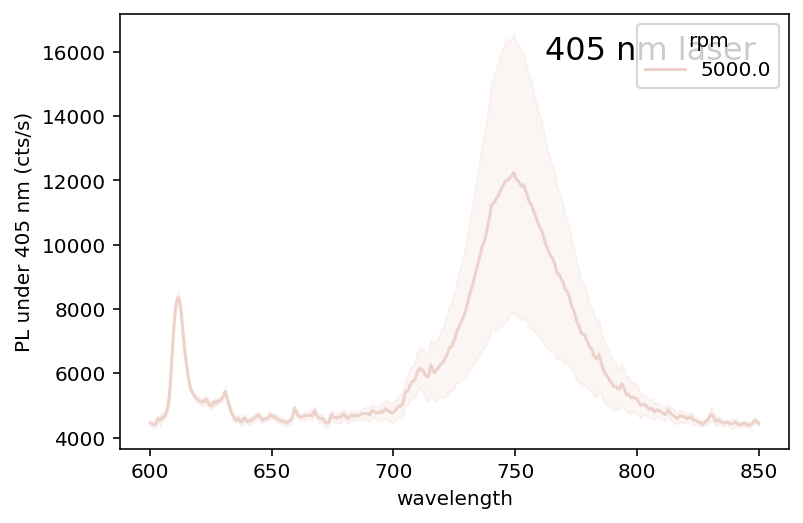

In [ ]:
sns.lineplot(
    data = specdf[
        (specdf['wavelength']>600)
        & (specdf['wavelength'] < 850)
    ],
    x='wavelength',
    y='blueplspec',
    hue='rpm',
#     palette='Set2',
#     style='antisolvent_droptime',
    ci='sd'
#     n_boot=100
)
# plt.ylim(top=5000, bottom=0)
plt.ylabel('PL under 405 nm (cts/s)')
frgplt.cornertext('405 nm laser', fontsize=16)
plt.savefig('bluepl_spread', dpi=300)

## Overview Plots

# Process Confirmation

In [ ]:
import json

In [ ]:
with open(os.path.join(resultsdir, 'maestrolog.json'), 'r') as f:
    log = json.load(f)

In [ ]:
columns = ['sample', 'task', 'start', 'start_actual', 'finish_actual']
dfData = {c:[] for c in columns}
for s, d in log.items():
    for t in d['tasks']:
        for c in columns:
            dfData[c].append(t[c])
df = pd.DataFrame(dfData)

In [ ]:
def duration(r):
    if r['task'] != 'anneal':
        return r['finish_actual'] - r['start_actual']

    onto_hp = df[
        (df['sample']==r['sample'])
        & (df['task']=='spincoater_to_hotplate')
    ]['finish_actual'].values[0]
    off_hp = df[
        (df['sample']==r['sample'])
        & (df['task']=='hotplate_to_storage')
    ]['finish_actual'].values[0] - 10
    return off_hp-onto_hp

In [ ]:
df['duration'] = df.apply(duration, axis=1)

In [ ]:
df['task'].unique()

array(['storage_to_spincoater', 'spincoat', 'spincoater_to_hotplate',
       'anneal', 'hotplate_to_storage', 'cooldown',
       'storage_to_characterization', 'characterize',
       'characterization_to_storage', 'idle_gantry'], dtype=object)

In [ ]:
def nominal_time(r):
    task_times = {
        'characterize':95,
        'storage_to_spincoater':33,
        'spincoater_to_hotplate':25,
        'hotplate_to_storage':18,
        'idle_gantry':20,
        'storage_to_characterization':18,
        'cooldown':180,
        'characterization_to_storage':18
    }
    if r['task'] in task_times:
        return task_times[r['task']]
    if r['task'] == 'anneal':
        return log[r['sample']]['anneal_recipe']['duration']
    if r['task'] == 'spincoat':
        return log[r['sample']]['spincoat_recipe']['duration'] + 30
df['nominal'] = df.apply(nominal_time, axis=1)

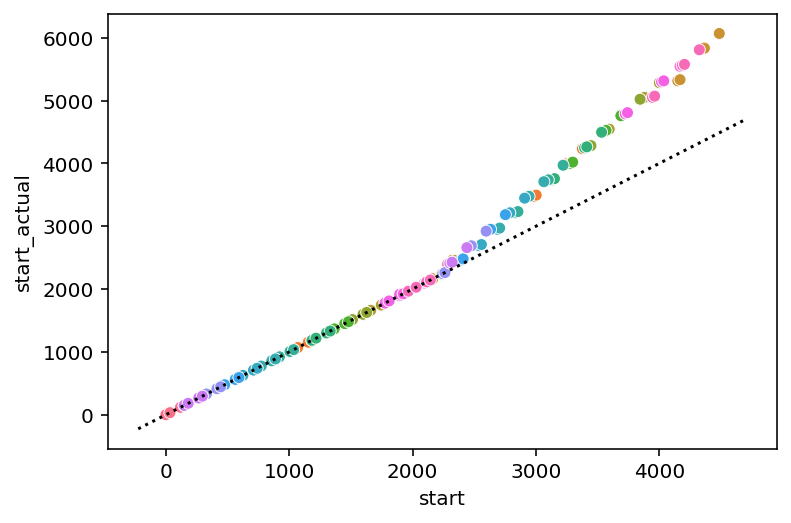

In [ ]:
sns.scatterplot(
    data=df,
    x='start',
    y='start_actual',
    hue='sample'
)
plt.plot(plt.xlim(), plt.xlim(), ':k')
plt.legend().remove()
plt.savefig('Scheduling Accuracy', dpi=300, bbox_inches='tight')


<AxesSubplot:xlabel='duration', ylabel='task'>

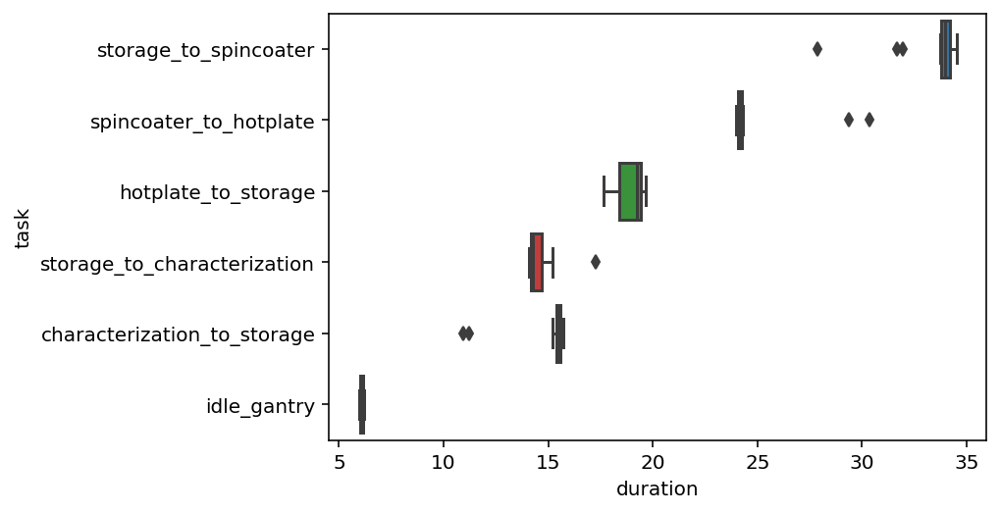

In [ ]:
sns.boxplot(
    data=df[
        ~df['task'].isin(['anneal', 'cooldown', 'spincoat', 'characterize'])
    ],
    y='task',
    x='duration'
)

In [ ]:
df['delta'] = df['duration'] - df['nominal']

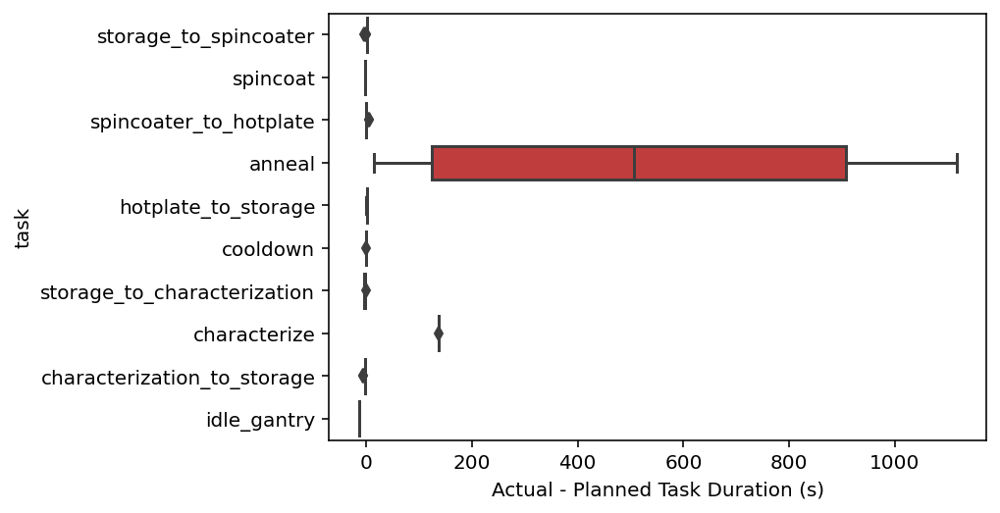

In [ ]:
sns.boxplot(
    data=df,#[
#         ~df['task'].isin(['anneal', 'cooldown', 'spincoat', 'characterize'])
#     ],
    y='task',
    x='delta'
)
plt.xlabel('Actual - Planned Task Duration (s)')
# plt.xlim(-10, 10)
plt.savefig('Task Timing Accuracy', dpi=300, bbox_inches='tight')

Test for spincoating accuracy

In [ ]:
log['sample0']['spincoat_recipe']['record'].keys()

dict_keys(['aspirate_solution', 'dispense_solution', 'aspirate_antisolvent', 'clear_chuck', 'dispense_antisolvent', 'time', 'rpm', 'headstart'])

In [ ]:
def plot_spincoat(sample):
    scr = log[sample]['spincoat_recipe']
#     fig, ax = plt.subplots(2,1, figsize=(8,4), sharex=True)
    plt.plot(scr['record']['time'], scr['record']['rpm'])
    for task, t in scr['record'].items():
        if task not in ['time', 'rpm', 'clear_chuck']:
            plt.plot([t,t], [-50, 50+max(scr['record']['rpm'])], ':', label=task)
    plt.legend(bbox_to_anchor=(1.04,0.7), loc="upper left")   
    plt.xlabel('Time (s)')
    plt.ylabel('RPM')

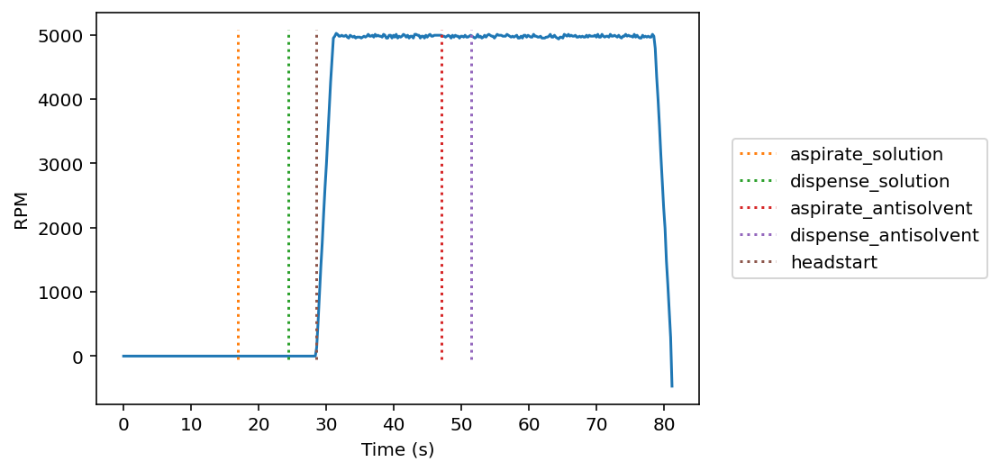

In [ ]:
plot_spincoat('sample0')
plt.savefig('Example Spincoat Log', dpi=300, bbox_inches='tight')


In [ ]:
df.columns

Index(['sample', 'task', 'start', 'start_actual', 'finish_actual', 'duration',
       'nominal', 'delta'],
      dtype='object')